# Bandits for Math of OR paper

In [18]:
# PACKAGES
import numpy as np
from numpy.random import beta
from time import time
from IPython.display import clear_output
from tqdm import tqdm
import matplotlib
import matplotlib.pyplot as plt

## Arms 

A Bernoulli arm and multiple Bernoulli distributed arms

In [19]:
class Bernoulli_arm:
    ''' Bernoulli distributed arm
    
    Argument:
        p -- probability of success 
    
    Method:
        pull() -- pulls the arm reward 1. or 0.
    
    '''
    def __init__(self,p):
        self.prob = p
        self.num_pulls = 0
        self.tot_reward = 0.
        
    def pull(self):
        self.num_pulls += 1
        if np.random.rand() < self.prob :
            self.tot_reward += 1.
            return 1.
        else :
            return 0.
        
class Bernoulli_multiarm(list):
    ''' Bernoulli Multi-arm
    
    Summary: An array of Bernoulli arms
    
    Argument:
        p -- an array of probabilities for each arm
    
    Methods:
        rewards() -- array with total reward for each arm       
        pulls()   -- array with number of pulls of each arm   
    '''
    
    def __init__(self,p):
        super().__init__()
        self.probs = p
        for prob in p :
            self.append(Bernoulli_arm(prob))
            
    def rewards(self):
        return [arm.tot_reward for arm in self]
    
    def pulls(self):
        return [arm.num_pulls for arm in self]

## Multi-Arm Bandits

- epsilon greedy (decaying and fixed)
- exp3 
- Samba (with and without cooling)
- Samba (with averaging)
- Thompson Sampling
- UCB 
- Gradient Bandit Algorithm (aka REINFORCE for bandits)


In [20]:
class epsilon_greedy_bandit:
    ''' Epsilon Geedy Bandit Algorithm
    
    Summary: 
        chooses arm with maximum reward 
        else, with probability epsilon, chooses a random arm
        
    Arguments:
        num_actions   -- number of actions/arms (int)
        explore_prob  -- exploration probability (float)
        
    Additional Arguments:
        decay    -- if decay probability (bool) 
                    decay function is min(epsilon/time,1)
        decay_fn -- custom decay function
                    (python function one variable [time] as input)
    
    Methods: 
        act()             -- returns arm index (int)
        train(arm,reward) -- add to rewards of arm        
    
    Example:
        >>> bandit = epsilon_greedy_bandit(10,0.1)
        >>> arm = bandit.act()
        >>> reward = Arms[arm].pull()
        >>> bandit.train(arm,reward)
    '''
    
    def __init__(self, num_actions, epsilon, decay=False, decay_fn=None):  
        self.num_arms = num_actions
        self.rewards = [ 0. for arm in range(self.num_arms)] 
        self.time = 0 # amount of training data *not* number of plays        
        
        self.epsilon = epsilon      
        self.decay = decay
        self.decay_fn = decay_fn
        
    def train(self, arm, reward):
        self.rewards[arm] += reward
        self.time += 1
    
    def act(self):     
        prob = self._explore_prob(self.time,self.decay,self.decay_fn)
        if np.random.rand() < prob:
            return np.random.randint(self.num_arms)
        else:
            return np.argmax(self.rewards)
        
    def _explore_prob(self, time, decay, decay_fn):
        if decay is False:
            return self.epsilon
        elif decay_fn is None:
            return self.epsilon/(time+1)
        else:
            return decay_fn(time)
        
class exp3_bandit:
    ''' Exponential weights for Exploration and Exploitation (Exp3)
    
    Summary: 
        Apply exponential weight to loss [negative reward plus 1] of each arm
        sample proportional to distribution of weights
    
    Source: 
        Exp3 algorithm [with eta=sqrt(log K/tK)] page 24 of
        'Regret Analysis of Stochastic and Nonstochastic Multi-armed Bandit Problems'
        Bubeck and Cesa-Bianchi. Foundations and Trends in Machine Learning (2012)
        
    Arguments:
        num_actions -- number of actions/arms (int)

    Methods: 
        act()             -- returns arm index (int)
        train(arm,reward) -- add to rewards of arm   
    '''
    
    def __init__(self, num_actions):  
        self.num_arms = num_actions
        self.time = 0 # amount of training data *not* number of plays    
        self.weights = np.ones(self.num_arms)
        self.probs = self.weights/np.sum(self.weights)
        self.losses = np.array([ 0. for arm in range(self.num_arms)]) # not cummulative loss, is reweighted by probs
        self.eta = 0.
        
    def train(self, arm, reward):
        self.time += 1
        self.losses[arm] += (1-reward)/self.probs[arm]
        self.eta = np.sqrt(np.log(self.num_arms)/(self.num_arms*self.time))
        self.weights = np.exp(-1.*self.eta*self.losses)
        self.probs = self.weights/np.sum(self.weights)
        
    def act(self):
        return np.random.choice(self.num_arms,p=self.probs)
    
class samba_bandit:
    ''' Stochastic Approximation Multi-arm Bandit Algorithm (SAMBA)
    
    Summary: 
        A stochastic approximation algorithm for multi-arm bandits.
        
    Arguments:
        num_actions -- number of actions/arms (int)
        
    Additional Arguments:
        alpha -- learning rate between 0 and 1 (float)
        cooling -- apply cooling to learning rate (bool)

    Methods: 
        act()             -- returns arm index (int)
        train(arm,reward) -- add to rewards of arm   
    '''
    
    def __init__(self, num_actions, alpha=0.1, cooling=False):
        self.num_arms = num_actions
        self.probs = np.ones(self.num_arms)/self.num_arms
        self.alpha = alpha
        self.cooling = cooling
        if self.cooling :
            self.alphas = self.alpha / (np.log(np.e*np.ones(self.num_arms)-np.log(self.probs)))
        else:
            self.alphas = self.alpha * np.ones(self.num_arms)
            
        
    def train(self,arm,reward):
        arm_star = np.argmax(self.probs)
        p_star = self.probs[arm_star]
        
        if arm == arm_star :
            self.probs *= ( 1 - self.alphas * (self.probs) * reward / p_star )
        else :
            self.probs[arm] += self.alphas[arm] * self.probs[arm] * reward
        self.probs[arm_star] = 1-np.sum(np.delete(self.probs, arm_star, 0))
        
        if self.cooling :
            self.alphas = self.alpha / (np.log(np.e*np.ones(self.num_arms)-np.log(self.probs)))
        
    def act(self):
        return np.random.choice(self.num_arms,p=self.probs)

class average_samba_bandit:
    ''' Stochastic Approximation Multi-arm Bandit Algorithm (SAMBA)
    
    Summary: 
        A stochastic approximation algorithm for multi-arm bandits.
        Now with average rewards rather than importance sampled.
        
    Arguments:
        num_actions -- number of actions/arms (int)
        
    Additional Arguments:
        alpha -- learning rate between 0 and 1 (float)
        cooling -- apply cooling to learning rate (bool)

    Methods: 
        act()             -- returns arm index (int)
        train(arm,reward) -- add to rewards of arm   
    '''
    
    def __init__(self, num_actions, alpha=0.1, cooling=False):
        self.num_arms = num_actions
        self.probs = np.ones(self.num_arms)/self.num_arms
        self.alpha = alpha
        self.average_rewards = np.ones(self.num_arms)/self.num_arms
        self.num_arm_pulls = np.ones(self.num_arms)
        self.cooling = cooling
        if self.cooling :
            self.alphas = self.alpha / (np.log(np.e*np.ones(self.num_arms)-np.log(self.probs)))
        else:
            self.alphas = self.alpha * np.ones(self.num_arms)
            
        
    def train(self,arm,reward):

        # update rewards
        self.num_arm_pulls[arm] +=1
        self.average_rewards[arm] += (reward - self.average_rewards[arm])/self.num_arm_pulls[arm]   
        
        # update probabilities
        arm_star = np.argmax(self.probs)
        p_star = self.probs[arm_star]
        for a in range(self.num_arms):
            if a != arm_star :
                self.probs[a] += self.alphas[a] * (self.probs[a]**2)*( self.average_rewards[a] - self.average_rewards[arm_star] )

        self.probs[arm_star] = 1-np.sum(np.delete(self.probs, arm_star, 0))
        
        if self.cooling :
            self.alphas = self.alpha / (np.log(np.e*np.ones(self.num_arms)-np.log(self.probs)))
        
    def act(self):
        return np.random.choice(self.num_arms,p=self.probs)
    
class Thompson_bandit:
    ''' Thompson Sampling Bandit
    
    Summary:
        Maintains a beta distribution for each arm
        Samples one for each arm and recommends the maximal sample.
       
    Arguments:
        num_actions -- number of actions/arms (int)
    
    Additional Arguments
        alpha -- initial alpha for beta distribution (float)
        beta  -- initial beta for beta distribution (float)
        
    Methods: 
        act()             -- returns arm index (int)
        train(arm,reward) -- add to rewards of arm              
    '''
    
    def __init__(self,num_actions,alpha=1.,beta=1.):  
        self.num_arms = num_actions
        self.alphas = [alpha for _ in range(self.num_arms)]
        self.betas = [beta for _ in range(self.num_arms)]
        
    def train(self, arm, reward):
        self.alphas[arm] += reward
        self.betas[arm] += 1. - reward
    
    def act(self):
        sample = [ np.random.beta(self.alphas[arm], self.betas[arm]) \
                      for arm in range(self.num_arms)]
        return np.argmax(sample)
    
class UCB_bandit:
    ''' UCB Bandit Algorithm
    
    Summary:
        Chooses arm with maximal mean reward plus confidence bound.

    Source: UCB1 algorthim from
            'Finite-time Analysis of the Multiarmed Bandit Problem' 
            Auer, Cesa-Bianchi, Fischer. JMLR 2002.

    Arguments:
        num_actions -- number of actions/arms (int)

    Methods: 
        act()             -- returns arm index (int)
        train(arm,reward) -- add to rewards of arm    
    '''
    
    def __init__(self,num_actions):
        self.num_arms = num_actions
        self.time = 0
        self.trials = [0 for _ in range(self.num_arms)] # number trails per arm
        self.x_hat = [0. for _ in range(self.num_arms)] # mean reward per arm
        self.UCBs = [np.inf for _ in range(self.num_arms)] # upper-confidence bounds per arm
        
    def train(self, arm, reward):
        self.trials[arm] += 1
        self.time += 1
        self.x_hat[arm] += (reward - self.x_hat[arm])/self.trials[arm] 
            
    def act(self): 
        for arm in range(self.num_arms):
            self.UCBs[arm] = self.x_hat[arm] \
                            + ( 2*np.log(self.trials[arm])/self.time )**(1./2)\
                            if self.trials[arm] > 0 else np.inf
            
        return np.argmax(self.UCBs)
    
    
class Gradient_Bandit_Algorithm:
    ''' Gradient Bandit Algorithm 
    
    Summary:
        Applies gradient ascent to exponential weight for each arm
        
    Source: Section 2.8
        'Reinforcement Learning: An Introduction'
        Richard S. Sutton and Andrew G. Barto
        
    Arguments:
        num_actions -- number of actions/arms (int)
        alpha       -- learning rate (float)

    Methods: 
        act()             -- returns arm index (int)
        train(arm,reward) -- add to rewards of arm    
    
    '''
    def __init__(self,num_actions,alpha):
        self.num_arms = num_actions
        self.alpha = alpha
        self.time = 0
        self.av_reward = 0.
        self.weights = np.zeros(self.num_arms)
        self.probs =np.ones(self.num_arms)/self.num_arms
        
    def _update_probs(self):
        exp_weights = np.exp(self.weights)
        self.probs = exp_weights/sum(exp_weights)
        
    def train(self, arm, reward):
        self.time += 1
        self.av_reward += (reward - self.av_reward)/self.time
        self.weights -= self.alpha * (reward - self.av_reward) * self.probs
        self.weights[arm] += self.alpha * (reward - self.av_reward)
        self._update_probs()
        
    def act(self):
        return np.random.choice(self.num_arms,p=self.probs)

## Figure 1

Samba for different values of $\alpha$ for probabilities $0.1$, $0.2$, ..., $0.9$.

In [21]:
probs = [0.9, 0.8, 0.7, 0.6, 0.5, 0.4, 0.3, 0.2, 0.1]
alphas = [0.001, 0.01, 0.1, 0.5]
Time = 1000000
Ps = dict()

for alp in alphas:
    bandit = samba_bandit(len(probs),alpha=alp)
    Arms = Bernoulli_multiarm(probs)
    samba_probs = []
    for _ in range(Time):
        arm = bandit.act()
        reward = Arms[arm].pull()
        bandit.train(arm,reward)
        samba_probs.append(np.array(bandit.probs))
    Arms.rewards()
    print(np.sum(Arms.rewards()))
    Ps[alp] = [1-samba_probs[i][0] for i in range(len(samba_probs))]

869727.0
894544.0
899490.0
900228.0


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


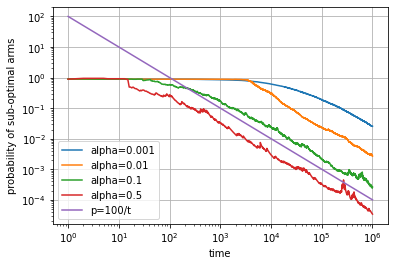

In [22]:
t = np.arange(1, Time+1, 1)

fig, ax = plt.subplots()
ax.loglog(t, Ps[0.001], label='alpha=0.001')#, t, Ps[0.01], t, Ps[0.1], t, Ps[0.5], t, 100/t)
ax.loglog(t, Ps[0.01], label='alpha=0.01')
ax.loglog(t, Ps[0.1], label='alpha=0.1')
ax.loglog(t, Ps[0.5], label='alpha=0.5')
ax.loglog(t, 100/t, label='p=100/t')
ax.set(xlabel='time', ylabel='probability of sub-optimal arms')#, title='SAMBA without cooling')
ax.grid()
plt.legend()

fig.savefig("SAMBA_no_cool.pdf", format='pdf', dpi=1000)
fig.savefig('destination_path.eps', format='eps', dpi=1000)
plt.show()

## Figure 2
Samba for different values of $\alpha$ for probabilities $0.1$, $0.2$, ..., $0.9$.

In [26]:
probs = [0.9, 0.8, 0.7, 0.6, 0.5, 0.4, 0.3, 0.2, 0.1]
Ps = dict()
alphas = [0.001, 0.01, 0.1, 0.5]
Time = 1000000
for alp in alphas:
    bandit = samba_bandit(len(probs),alpha=alp, cooling=True)
    Arms = Bernoulli_multiarm(probs)
    samba_probs = []
    for _ in range(Time):
        arm = bandit.act()
        reward = Arms[arm].pull()
        bandit.train(arm,reward)
        samba_probs.append(np.array(bandit.probs))
    Arms.rewards()
    print(np.sum(Arms.rewards()))
    Ps[alp] = [1-samba_probs[i][0] for i in range(len(samba_probs))]

844368.0
890437.0
898730.0
898777.0


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


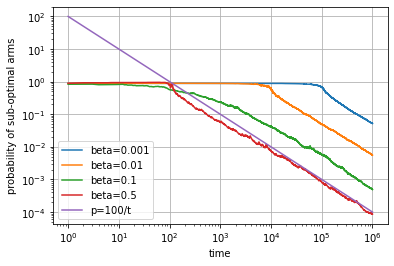

In [27]:
t = np.arange(1, Time+1, 1)

fig, ax = plt.subplots()
for alp in alphas:
    ax.loglog(t, Ps[alp], label='beta='+str(alp))
ax.loglog(t, 100/t, label='p=100/t')
ax.set(xlabel='time', ylabel='probability of sub-optimal arms')#, title='SAMBA with cooling')
ax.grid()
plt.legend()

fig.savefig("test.png")
fig.savefig("test.pdf", format='pdf', dpi=1000)
fig.savefig('destination_path.eps', format='eps', dpi=1000)
plt.show()

## Figure 3
Plot with percentiles

In [28]:
# Get data for samba
All_Ps = [] 
N=100
alpha = 0.1
for i in tqdm(range(N)):
    Ps = dict()
    for alp in [alpha]:
        bandit = samba_bandit(len(probs),alpha=alp)
        Arms = Bernoulli_multiarm(probs)
        samba_probs = []
        Time = 100000
        for _ in range(Time):
            arm = bandit.act()
            reward = Arms[arm].pull()
            bandit.train(arm,reward)
            samba_probs.append(np.array(bandit.probs))
        Arms.rewards()
        Ps[alp] = [1-samba_probs[i][0] for i in range(len(samba_probs))]
    #print(i)
    All_Ps.append(Ps)

100%|██████████| 100/100 [16:29<00:00,  9.89s/it]


In [29]:
# now go for percentiles
matrices = dict()
for i in range(1,N):
    for key, val in All_Ps[i].items():
        if not i==1 :
            matrices[key] = np.concatenate((matrices[key],np.array([val])),axis=0) 
        else :
            matrices[key] = np.array([val])

m = matrices[alpha]
Ps_sum50 = np.percentile(m, 50, axis=0)
Ps_sum10 = np.percentile(m, 10, axis=0)
Ps_sum90 = np.percentile(m, 90, axis=0)

In [30]:
# Now get data with cooling
All_Ps2 = [] 
N=100
alpha = 0.1
for i in tqdm(range(N)):
    Ps = dict()
    alphas = [alpha]
    for alp in alphas:
        bandit = samba_bandit(len(probs),alpha=alp, cooling=True)
        Arms = Bernoulli_multiarm(probs)
        samba_probs = []
        Time = 100000
        for _ in range(Time):
            arm = bandit.act()
            reward = Arms[arm].pull()
            bandit.train(arm,reward)
            samba_probs.append(np.array(bandit.probs))
        Arms.rewards()
        print(np.sum(Arms.rewards()))
        Ps[alp] = [1-samba_probs[i][0] for i in range(len(samba_probs))]
    All_Ps2.append(Ps)        


  1%|          | 1/100 [00:11<18:19, 11.11s/it]

89085.0


  2%|▏         | 2/100 [00:24<20:39, 12.65s/it]

89265.0


  3%|▎         | 3/100 [00:36<19:54, 12.31s/it]

89181.0


  4%|▍         | 4/100 [00:49<19:46, 12.36s/it]

89249.0


  5%|▌         | 5/100 [01:00<18:52, 11.92s/it]

89115.0


  6%|▌         | 6/100 [01:11<18:16, 11.66s/it]

89001.0


  7%|▋         | 7/100 [01:23<18:11, 11.73s/it]

89248.0


  8%|▊         | 8/100 [01:35<18:07, 11.82s/it]

89080.0


  9%|▉         | 9/100 [01:47<18:13, 12.02s/it]

89014.0


 10%|█         | 10/100 [01:59<17:59, 11.99s/it]

88888.0


 11%|█         | 11/100 [02:10<17:26, 11.75s/it]

89103.0


 12%|█▏        | 12/100 [02:22<17:13, 11.74s/it]

88974.0


 13%|█▎        | 13/100 [02:35<17:16, 11.92s/it]

88983.0


 14%|█▍        | 14/100 [02:46<16:55, 11.81s/it]

89152.0


 15%|█▌        | 15/100 [02:58<16:59, 11.99s/it]

89124.0


 16%|█▌        | 16/100 [03:11<16:49, 12.02s/it]

87919.0


 17%|█▋        | 17/100 [03:22<16:34, 11.98s/it]

89106.0


 18%|█▊        | 18/100 [03:44<20:18, 14.86s/it]

89025.0


 19%|█▉        | 19/100 [03:56<18:48, 13.93s/it]

89086.0


 20%|██        | 20/100 [04:08<17:43, 13.30s/it]

89100.0


 21%|██        | 21/100 [04:23<18:16, 13.87s/it]

89089.0


 22%|██▏       | 22/100 [04:36<17:49, 13.71s/it]

89142.0


 23%|██▎       | 23/100 [04:49<17:26, 13.58s/it]

88851.0


 24%|██▍       | 24/100 [05:02<16:54, 13.35s/it]

89042.0


 25%|██▌       | 25/100 [05:17<17:09, 13.73s/it]

89001.0


 26%|██▌       | 26/100 [05:33<17:39, 14.31s/it]

88784.0


 27%|██▋       | 27/100 [05:47<17:20, 14.26s/it]

89010.0


 28%|██▊       | 28/100 [06:00<16:54, 14.10s/it]

89115.0


 29%|██▉       | 29/100 [06:13<16:17, 13.77s/it]

89081.0


 30%|███       | 30/100 [06:29<16:41, 14.31s/it]

89363.0


 31%|███       | 31/100 [06:43<16:18, 14.18s/it]

89114.0


 32%|███▏      | 32/100 [06:57<16:08, 14.25s/it]

88839.0


 33%|███▎      | 33/100 [07:12<16:00, 14.33s/it]

89214.0


 34%|███▍      | 34/100 [07:25<15:27, 14.05s/it]

89401.0


 35%|███▌      | 35/100 [07:39<15:04, 13.92s/it]

89141.0


 36%|███▌      | 36/100 [07:53<15:05, 14.14s/it]

88880.0


 37%|███▋      | 37/100 [08:08<14:53, 14.19s/it]

89190.0


 38%|███▊      | 38/100 [08:21<14:28, 14.01s/it]

89205.0


 39%|███▉      | 39/100 [08:37<14:49, 14.58s/it]

89068.0


 40%|████      | 40/100 [08:51<14:13, 14.22s/it]

89164.0


 41%|████      | 41/100 [09:04<13:40, 13.90s/it]

89141.0


 42%|████▏     | 42/100 [09:19<13:46, 14.26s/it]

88996.0


 43%|████▎     | 43/100 [09:34<13:44, 14.46s/it]

89058.0


 44%|████▍     | 44/100 [09:47<13:10, 14.12s/it]

89221.0


 45%|████▌     | 45/100 [10:02<13:06, 14.29s/it]

88894.0


 46%|████▌     | 46/100 [10:17<12:59, 14.44s/it]

88881.0


 47%|████▋     | 47/100 [10:30<12:35, 14.25s/it]

88287.0


 48%|████▊     | 48/100 [10:44<12:06, 13.98s/it]

89342.0


 49%|████▉     | 49/100 [10:58<11:56, 14.05s/it]

89140.0


 50%|█████     | 50/100 [11:11<11:32, 13.85s/it]

89114.0


 51%|█████     | 51/100 [11:24<11:00, 13.48s/it]

89329.0


 52%|█████▏    | 52/100 [11:38<10:57, 13.69s/it]

89145.0


 53%|█████▎    | 53/100 [11:50<10:23, 13.27s/it]

88912.0


 54%|█████▍    | 54/100 [12:11<11:56, 15.57s/it]

88950.0


 55%|█████▌    | 55/100 [12:26<11:22, 15.16s/it]

89093.0


 56%|█████▌    | 56/100 [12:34<09:41, 13.22s/it]

89111.0


 57%|█████▋    | 57/100 [12:45<08:57, 12.50s/it]

89199.0


 58%|█████▊    | 58/100 [13:01<09:33, 13.64s/it]

89084.0


 59%|█████▉    | 59/100 [13:16<09:27, 13.84s/it]

89070.0


 60%|██████    | 60/100 [13:29<09:06, 13.67s/it]

89248.0


 61%|██████    | 61/100 [13:43<08:53, 13.68s/it]

89053.0


 62%|██████▏   | 62/100 [13:55<08:25, 13.31s/it]

88966.0


 63%|██████▎   | 63/100 [14:08<08:12, 13.32s/it]

89211.0


 64%|██████▍   | 64/100 [14:23<08:09, 13.61s/it]

89233.0


 65%|██████▌   | 65/100 [14:37<08:06, 13.91s/it]

89235.0


 66%|██████▌   | 66/100 [14:52<08:00, 14.14s/it]

89135.0


 67%|██████▋   | 67/100 [15:07<07:51, 14.30s/it]

89075.0


 68%|██████▊   | 68/100 [15:18<07:08, 13.39s/it]

89066.0


 69%|██████▉   | 69/100 [15:26<06:08, 11.89s/it]

89197.0


 70%|███████   | 70/100 [15:35<05:26, 10.88s/it]

88873.0


 71%|███████   | 71/100 [15:47<05:27, 11.28s/it]

89158.0


 72%|███████▏  | 72/100 [16:02<05:42, 12.22s/it]

88785.0


 73%|███████▎  | 73/100 [16:17<05:56, 13.21s/it]

89192.0


 74%|███████▍  | 74/100 [16:31<05:47, 13.38s/it]

88866.0


 75%|███████▌  | 75/100 [16:46<05:47, 13.88s/it]

89149.0


 76%|███████▌  | 76/100 [17:00<05:35, 13.97s/it]

89093.0


 77%|███████▋  | 77/100 [17:14<05:22, 14.03s/it]

89322.0


 78%|███████▊  | 78/100 [17:29<05:11, 14.15s/it]

89162.0


 79%|███████▉  | 79/100 [17:43<04:58, 14.20s/it]

89069.0


 80%|████████  | 80/100 [18:01<05:06, 15.34s/it]

89211.0


 81%|████████  | 81/100 [18:10<04:17, 13.56s/it]

89037.0


 82%|████████▏ | 82/100 [18:19<03:34, 11.94s/it]

89238.0


 83%|████████▎ | 83/100 [18:35<03:46, 13.30s/it]

88973.0


 84%|████████▍ | 84/100 [18:50<03:39, 13.75s/it]

89151.0


 85%|████████▌ | 85/100 [19:04<03:29, 13.96s/it]

89327.0


 86%|████████▌ | 86/100 [19:18<03:14, 13.89s/it]

89002.0


 87%|████████▋ | 87/100 [19:32<02:59, 13.83s/it]

89070.0


 88%|████████▊ | 88/100 [19:46<02:46, 13.86s/it]

89120.0


 89%|████████▉ | 89/100 [20:00<02:32, 13.90s/it]

89210.0


 90%|█████████ | 90/100 [20:14<02:19, 13.91s/it]

89156.0


 91%|█████████ | 91/100 [20:28<02:06, 14.08s/it]

89162.0


 92%|█████████▏| 92/100 [20:44<01:56, 14.54s/it]

88999.0


 93%|█████████▎| 93/100 [20:57<01:38, 14.10s/it]

89012.0


 94%|█████████▍| 94/100 [21:05<01:14, 12.48s/it]

88835.0


 95%|█████████▌| 95/100 [21:22<01:07, 13.58s/it]

89307.0


 96%|█████████▌| 96/100 [21:36<00:55, 13.86s/it]

89399.0


 97%|█████████▋| 97/100 [21:51<00:42, 14.10s/it]

89035.0


 98%|█████████▊| 98/100 [22:05<00:28, 14.05s/it]

89074.0


 99%|█████████▉| 99/100 [22:18<00:13, 13.95s/it]

88968.0


100%|██████████| 100/100 [22:32<00:00, 13.52s/it]

89155.0


In [31]:
# now go for percentiles
matrices = dict()
for i in range(1,N):
    for key, val in All_Ps2[i].items():
        if not i==1 :
            matrices[key] = np.concatenate((matrices[key],np.array([val])),axis=0) 
        else :
            matrices[key] = np.array([val])

m2 = matrices[alpha]
Ps2_sum50 = np.percentile(m2, 50, axis=0)
Ps2_sum10 = np.percentile(m2, 10, axis=0)
Ps2_sum90 = np.percentile(m2, 90, axis=0)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


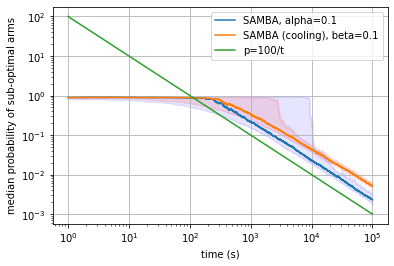

In [32]:
# now plot
t = np.arange(1, Time+1, 1)

fig, ax = plt.subplots()
ax.loglog(t, Ps_sum50, label='SAMBA, alpha=0.1')
ax.fill_between(t, Ps_sum10, Ps_sum90, color='b', alpha=.1)
ax.loglog(t, Ps2_sum50, label='SAMBA (cooling), beta=0.1')
ax.fill_between(t, Ps2_sum10, Ps2_sum90, color='r', alpha=.1)
ax.loglog(t, 100/t, label='p=100/t')
ax.set(xlabel='time (s)', ylabel='median probability of sub-optimal arms')
ax.grid()
plt.legend()

fig.savefig("SAMBA_no_cool.pdf", format='pdf', dpi=1000)
fig.savefig('destination_path.eps', format='eps', dpi=1000)
plt.show()

## Figure 4 & Figure 5
Plot for multiple bandit algorithms over time

In [86]:
Time = 1000
num_experiments = 1000
probs = np.array([0.1,0.5,0.8,0.9])
probs = np.array([0.01,0.05,0.08,0.09]) # Uncomment for Fig.5
Data = dict()

In [87]:
All_rewards = np.zeros(Time)
for __ in range(num_experiments):
    bandit = epsilon_greedy_bandit(4,.1)
    Arms = Bernoulli_multiarm(probs)
    rewards = []
    tot_reward = 0.
    for _ in range(Time):
        arm = bandit.act()
        reward = Arms[arm].pull()
        bandit.train(arm,reward)

        tot_reward += reward
        rewards.append(tot_reward)
    All_rewards += np.array(rewards)
    print(__,'/',num_experiments)
    clear_output(wait=True)
    
Av_rewards = All_rewards/num_experiments
Regret = [ np.max(probs)*t - av for t, av in enumerate(Av_rewards)]
Data['Greedy']=Regret
print(Regret[-1])

50.81999999999999


In [88]:

All_rewards = np.zeros(Time)

for __ in range(num_experiments):
    bandit = epsilon_greedy_bandit(4,100.,decay=True)
    Arms = Bernoulli_multiarm(probs)
    rewards = []
    tot_reward = 0.
    for _ in range(Time):
        arm = bandit.act()
        reward = Arms[arm].pull()
        bandit.train(arm,reward)

        tot_reward += reward
        rewards.append(tot_reward)
    All_rewards += np.array(rewards)
    print(__,'/',num_experiments)
    clear_output(wait=True)
    
Av_rewards = All_rewards/num_experiments
Regret = [ np.max(probs)*t - av for t, av in enumerate(Av_rewards)]
print(Regret[-1])
Data['Greedy_Decay']=Regret

18.02799999999999


In [89]:

All_rewards = np.zeros(Time)

for __ in range(num_experiments):
    bandit = exp3_bandit(4)
    Arms = Bernoulli_multiarm(probs)
    rewards = []
    tot_reward = 0.
    for _ in range(Time):

        arm = bandit.act()
        reward = Arms[arm].pull()
        bandit.train(arm,reward)

        tot_reward += reward
        rewards.append(tot_reward)
    All_rewards += np.array(rewards)
    print(__,'/',num_experiments)
    clear_output(wait=True)
    
Av_rewards = All_rewards/num_experiments
Regret = [ np.max(probs)*t - av for t, av in enumerate(Av_rewards)]
print(Regret[-1])
Data['Exp3']=Regret

26.242999999999995


In [90]:

All_rewards = np.zeros(Time)

for __ in range(num_experiments):
    bandit = samba_bandit(4,alpha=0.1)
    Arms = Bernoulli_multiarm(probs)
    rewards = []
    tot_reward = 0.
    for _ in range(Time):
        arm = bandit.act()
        reward = Arms[arm].pull()
        bandit.train(arm,reward)
        
        tot_reward += reward
        rewards.append(tot_reward)
    All_rewards += np.array(rewards)
    print(__,'/',num_experiments)
    clear_output(wait=True)
    
Av_rewards = All_rewards/num_experiments
Regret = [ np.max(probs)*t - av for t, av in enumerate(Av_rewards)]
print(Regret[-1])
Data['Samba']=Regret

21.067999999999998


In [91]:

All_rewards = np.zeros(Time)

for __ in range(num_experiments):
    bandit = samba_bandit(4,alpha=1.0,cooling=True)
    Arms = Bernoulli_multiarm(probs)
    rewards = []
    tot_reward = 0.
    for _ in range(Time):
        arm = bandit.act()
        reward = Arms[arm].pull()
        bandit.train(arm,reward)

        tot_reward += reward
        rewards.append(tot_reward)
    All_rewards += np.array(rewards)
    print(__,'/',num_experiments)
    clear_output(wait=True)

Av_rewards = All_rewards/num_experiments
Regret = [ np.max(probs)*t - av for t, av in enumerate(Av_rewards)]
print(Regret[-1])
Data['Samba_Cool']=Regret

12.355999999999995


In [92]:

All_rewards = np.zeros(Time)

for __ in range(num_experiments):
    bandit = Thompson_bandit(4)
    Arms = Bernoulli_multiarm(probs)
    rewards = []
    tot_reward = 0.
    for _ in range(Time):
        arm = bandit.act()
        reward = Arms[arm].pull()
        bandit.train(arm,reward)

        tot_reward += reward
        rewards.append(tot_reward)
    All_rewards += np.array(rewards)
    print(__,'/',num_experiments)
    clear_output(wait=True)

Av_rewards = All_rewards/num_experiments
Regret = [ np.max(probs)*t - av for t, av in enumerate(Av_rewards)]
print(Regret[-1])
Data['Thompson']=Regret

12.772999999999996


In [93]:

All_rewards = np.zeros(Time)
probs = np.array(probs)

for __ in range(num_experiments):
    bandit = UCB_bandit(4)
    Arms = Bernoulli_multiarm(probs)
    rewards = []
    tot_reward = 0.
    for _ in range(Time):
        arm = bandit.act()
        reward = Arms[arm].pull()
        bandit.train(arm,reward)

        tot_reward += reward
        rewards.append(tot_reward)
    All_rewards += np.array(rewards)
    print(__,'/',num_experiments)
    clear_output(wait=True)

Av_rewards = All_rewards/num_experiments
Regret = [ np.max(probs)*t - av for t, av in enumerate(Av_rewards)]
print(Regret[-1])
Data['UCB']=Regret

65.65299999999999


In [94]:

All_rewards = np.zeros(Time)

for __ in range(num_experiments):
    bandit = Gradient_Bandit_Algorithm(4,0.1)
    Arms = Bernoulli_multiarm(probs)
    rewards = []
    tot_reward = 0.
    for _ in range(Time):
        arm = bandit.act()
        reward = Arms[arm].pull()
        bandit.train(arm,reward)

        tot_reward += reward
        rewards.append(tot_reward)
    All_rewards += np.array(rewards)
    print(__,'/',num_experiments)
    clear_output(wait=True)

Av_rewards = All_rewards/num_experiments
Regret = [ np.max(probs)*t - av for t, av in enumerate(Av_rewards)]
print(Regret[-1])
Data['GBA']=Regret

23.366


In [95]:

All_rewards = np.zeros(Time)

for __ in range(num_experiments):
    bandit = average_samba_bandit(4,alpha=0.9)
    Arms = Bernoulli_multiarm(probs)
    rewards = []
    tot_reward = 0.
    for _ in range(Time):
        arm = bandit.act()
        reward = Arms[arm].pull()
        bandit.train(arm,reward)
        
        tot_reward += reward
        rewards.append(tot_reward)
    All_rewards += np.array(rewards)
    print(__,'/',num_experiments)
    clear_output(wait=True)
    
Av_rewards = All_rewards/num_experiments
Regret = [ np.max(probs)*t - av for t, av in enumerate(Av_rewards)]
print(Regret[-1])
Data['Samba (average)']=Regret

11.754999999999995


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


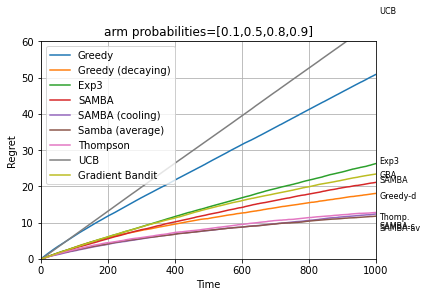

In [97]:
import matplotlib
import matplotlib.pyplot as plt

# Data for plotting (Figure 4)
t = np.arange(1, Time+1, 1)
plt.close()
fig, ax = plt.subplots()

ax.plot(Data['Greedy'],label='Greedy')
ax.plot(Data['Greedy_Decay'],label='Greedy (decaying)')
ax.plot(Data['Exp3'],label='Exp3')
ax.plot(Data['Samba'],label='SAMBA')
ax.plot(Data['Samba_Cool'],label='SAMBA (cooling)')
ax.plot(Data['Samba (average)'],label='Samba (average)')
ax.plot(Data['Thompson'],label='Thompson')
ax.plot(Data['UCB'],label='UCB')
ax.plot(Data['GBA'],label='Gradient Bandit')#, t, Ps[0.01], t, Ps[0.1], t, Ps[0.5], t, 100/t)
# ax.loglog(t, Ps[0.01], label='alpha=0.01')
# ax.loglog(t, Ps[0.1], label='alpha=0.1')
# ax.loglog(t, Ps[0.5], label='alpha=0.5')
ax.set(xlabel='Time', ylabel='Regret', title='arm probabilities=[0.1,0.5,0.8,0.9]')
ax.grid()
plt.xlim(0,1000)
plt.ylim(0,150)
#plt.text(1010,Data['Greedy'][-1],'Greedy',fontsize=8)
plt.text(1010,Data['Greedy_Decay'][-1]-1.5,'Greedy-d',fontsize=8)
plt.text(1010,Data['Exp3'][-1],'Exp3',fontsize=8)
plt.text(1010,Data['Samba'][-1],'SAMBA',fontsize=8)
plt.text(1010,Data['Samba_Cool'][-1]-4,'SAMBA-c',fontsize=8)
plt.text(1010,Data['Samba (average)'][-1]-4,'SAMBA-av',fontsize=8)
plt.text(1010,Data['Thompson'][-1]-2,'Thomp.',fontsize=8)
plt.text(1010,Data['UCB'][-1]+2,'UCB',fontsize=8)
plt.text(1010,Data['GBA'][-1]-1,'GBA',fontsize=8)
plt.legend()
#plt.autoscale()

fig.savefig("test.pdf", format='pdf', dpi=1000)
fig.savefig('destination_path.eps', format='eps', dpi=1000)
plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


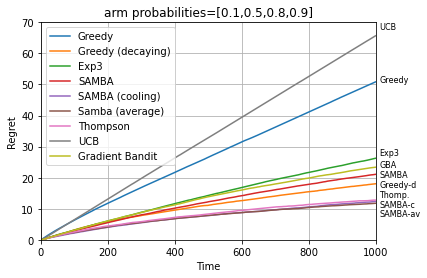

In [104]:
import matplotlib
import matplotlib.pyplot as plt

# Data for plotting (Figure 4)
t = np.arange(1, Time+1, 1)
plt.close()
fig, ax = plt.subplots()

ax.plot(Data['Greedy'],label='Greedy')
ax.plot(Data['Greedy_Decay'],label='Greedy (decaying)')
ax.plot(Data['Exp3'],label='Exp3')
ax.plot(Data['Samba'],label='SAMBA')
ax.plot(Data['Samba_Cool'],label='SAMBA (cooling)')
ax.plot(Data['Samba (average)'],label='Samba (average)')
ax.plot(Data['Thompson'],label='Thompson')
ax.plot(Data['UCB'],label='UCB')
ax.plot(Data['GBA'],label='Gradient Bandit')#, t, Ps[0.01], t, Ps[0.1], t, Ps[0.5], t, 100/t)
# ax.loglog(t, Ps[0.01], label='alpha=0.01')
# ax.loglog(t, Ps[0.1], label='alpha=0.1')
# ax.loglog(t, Ps[0.5], label='alpha=0.5')
ax.set(xlabel='Time', ylabel='Regret', title='arm probabilities=[0.01,0.05,0.08,0.09]')
ax.grid()
plt.xlim(0,1000)
plt.ylim(0,70)
plt.text(1010,Data['Greedy'][-1],'Greedy',fontsize=8)
plt.text(1010,Data['Greedy_Decay'][-1]-1.1,'Greedy-d',fontsize=8)
plt.text(1010,Data['Exp3'][-1]+1,'Exp3',fontsize=8)
plt.text(1010,Data['Samba'][-1]-1,'SAMBA',fontsize=8)
plt.text(1010,Data['Samba_Cool'][-1]-2,'SAMBA-c',fontsize=8)
plt.text(1010,Data['Samba (average)'][-1]-4,'SAMBA-av',fontsize=8)
plt.text(1010,Data['Thompson'][-1]+1,'Thomp.',fontsize=8)
plt.text(1010,Data['UCB'][-1]+2,'UCB',fontsize=8)
plt.text(1010,Data['GBA'][-1],'GBA',fontsize=8)
plt.legend()
#plt.autoscale()

fig.savefig("test.pdf", format='pdf', dpi=1000)
fig.savefig('destination_path.eps', format='eps', dpi=1000)
plt.show()

In [101]:
print(Data['Samba_Cool'][-1],Data['Samba (average)'][-1],Data['Thompson'][-1])

12.355999999999995 11.754999999999995 12.772999999999996


## Figure 5 
Plot with changing number of arms

In [43]:
Time = 1000
probs = dict()
for num_arms in [20, 40, 60, 80, 100]:
    probs[num_arms] = [ [np.random.rand()/10 for _ in range(num_arms)] for __ in range(100)]

In [44]:

tic = time()
Thomp_results = []
for num_arms in [20, 40, 60, 80, 100]:
    Thompson_all_rewards = []
    for idx, prob in enumerate(probs[num_arms]):
        rewards = []
        bandit = Thompson_bandit(len(prob))
        Arms = Bernoulli_multiarm(prob)
        for _ in range(Time):
            arm = bandit.act()
            reward = Arms[arm].pull()
            bandit.train(arm,reward)
            rewards.append(np.sum(Arms.rewards()))    
        Thompson_all_rewards.append(rewards)
        print(idx)
        clear_output(wait=True)
    
    print(np.mean([Thompson_all_rewards[i][-1] for i in range(len(Thompson_all_rewards)) ]))
    Thomp_results.append(np.mean([Thompson_all_rewards[i][-1] for i in range(len(Thompson_all_rewards)) ]))
    
toc = time()    
print(toc-tic)
print(np.mean([Thompson_all_rewards[i][-1] for i in range(len(Thompson_all_rewards)) ]))

54.96
87.15823721885681
54.96


In [45]:
Thomp_results

[59.52, 57.11, 52.94, 53.83, 54.96]

In [46]:
tic = time()
ucb_results = []
for num_arms in [20, 40, 60, 80, 100]:

    ucb_all_rewards = []
    for idx, prob in enumerate(probs[num_arms]):
        rewards = []
        bandit = UCB_bandit(len(prob))
        Arms = Bernoulli_multiarm(prob)
        for _ in range(Time):
            arm = bandit.act()
            reward = Arms[arm].pull()
            bandit.train(arm,reward)
            rewards.append(np.sum(Arms.rewards()))    
        ucb_all_rewards.append(rewards)
        print(idx)
        clear_output(wait=True)
        
    print(np.mean([ucb_all_rewards[i][-1] for i in range(len(ucb_all_rewards)) ]))
    ucb_results.append(np.mean([ucb_all_rewards[i][-1] for i in range(len(ucb_all_rewards)) ]))
    
toc = time()    
print(toc-tic)
print(np.mean([ucb_all_rewards[i][-1] for i in range(len(ucb_all_rewards)) ]))

75.81
128.13566899299622
75.81


In [47]:
ucb_results

[65.74, 72.1, 72.01, 71.72, 75.81]

In [48]:
tic = time()
samba_results = []
for num_arms in [20, 40, 60, 80, 100]:

    samba_all_rewards = []
    tic = time()
    for idx, prob in enumerate(probs[num_arms]):
        rewards = []
        bandit = samba_bandit(len(prob),alpha=1.0,cooling=True)
        Arms = Bernoulli_multiarm(prob)
        for _ in range(Time):
            arm = bandit.act()
            reward = Arms[arm].pull()
            bandit.train(arm,reward)
            rewards.append(np.sum(Arms.rewards()))    
        samba_all_rewards.append(rewards)
        print(idx)
        clear_output(wait=True)
        
    print(np.mean([samba_all_rewards[i][-1] for i in range(len(samba_all_rewards)) ]))
    samba_results.append(np.mean([samba_all_rewards[i][-1] for i in range(len(samba_all_rewards)) ]))
    
toc = time()    
print(toc-tic)
print(np.mean([samba_all_rewards[i][-1] for i in range(len(samba_all_rewards)) ]))

54.59
20.55555295944214
54.59


In [49]:
samba_results

[61.21, 58.38, 55.96, 54.49, 54.59]

In [50]:
tic = time()
greedy_results = []
for num_arms in [20, 40, 60, 80, 100]:

    greedy_all_rewards = []
    tic = time()
    for idx, prob in enumerate(probs[num_arms]):
        rewards = []
        bandit = epsilon_greedy_bandit(len(prob),100.,decay=True)
        Arms = Bernoulli_multiarm(prob)
        for _ in range(Time):
            arm = bandit.act()
            reward = Arms[arm].pull()
            bandit.train(arm,reward)
            rewards.append(np.sum(Arms.rewards()))    
        greedy_all_rewards.append(rewards)
        print(idx)
        clear_output(wait=True)
        
    print(np.mean([greedy_all_rewards[i][-1] for i in range(len(greedy_all_rewards)) ]))
    greedy_results.append(np.mean([greedy_all_rewards[i][-1] for i in range(len(greedy_all_rewards)) ]))
    
toc = time()    
print(toc-tic)
print(np.mean([greedy_all_rewards[i][-1] for i in range(len(greedy_all_rewards)) ]))

59.36
8.125119924545288
59.36


In [51]:
greedy_results

[64.48, 68.81, 65.13, 61.36, 59.36]

In [52]:
tic = time()
exp3_results = []
for num_arms in [20, 40, 60, 80, 100]:

    exp3_all_rewards = []
    tic = time()
    for idx, prob in enumerate(probs[num_arms]):
        rewards = []
        bandit = exp3_bandit(len(prob))
        Arms = Bernoulli_multiarm(prob)
        for _ in range(Time):
            arm = bandit.act()
            reward = Arms[arm].pull()
            bandit.train(arm,reward)
            rewards.append(np.sum(Arms.rewards()))    
        exp3_all_rewards.append(rewards)
        print(idx)
        clear_output(wait=True)
        
    print(np.mean([exp3_all_rewards[i][-1] for i in range(len(exp3_all_rewards)) ]))
    exp3_results.append(np.mean([exp3_all_rewards[i][-1] for i in range(len(exp3_all_rewards)) ]))



51.06


In [53]:
exp3_results

[51.86, 53.89, 51.45, 52.84, 51.06]

In [54]:
tic = time()
samba1_results = []
for num_arms in [20, 40, 60, 80, 100]:
    
    samba1_all_rewards = []
    tic = time()
    for idx, prob in enumerate(probs[num_arms]):
        rewards = []
        bandit = samba_bandit(len(prob),alpha=0.1)
        Arms = Bernoulli_multiarm(prob)
        for _ in range(Time):
            arm = bandit.act()
            reward = Arms[arm].pull()
            bandit.train(arm,reward)
            rewards.append(np.sum(Arms.rewards()))    
        samba1_all_rewards.append(rewards)
        print(idx)
        clear_output(wait=True)
    
    print(np.mean([samba1_all_rewards[i][-1] for i in range(len(samba1_all_rewards)) ]))
    samba1_results.append(np.mean([samba1_all_rewards[i][-1] for i in range(len(samba1_all_rewards)) ]))
    
toc = time()    
print(toc-tic)
print(np.mean([samba1_all_rewards[i][-1] for i in range(len(samba1_all_rewards)) ]))

50.35
14.717529058456421
50.35


In [55]:
samba1_results

[53.0, 51.94, 50.96, 50.84, 50.35]

In [56]:
tic = time()
sambam_results = []
for num_arms in [20, 40, 60, 80, 100]:
    
    sambam_all_rewards = []
    tic = time()
    for idx, prob in enumerate(probs[num_arms]):
        rewards = []
        bandit = samba_bandit_metropolis(len(prob),alpha=2.0,cooling=True)
        Arms = Bernoulli_multiarm(prob)
        for _ in range(Time):
            arm = bandit.act()
            reward = Arms[arm].pull()
            bandit.train(arm,reward)
            rewards.append(np.sum(Arms.rewards()))    
        sambam_all_rewards.append(rewards)
        print(idx)
        clear_output(wait=True)
    
    print(np.mean([sambam_all_rewards[i][-1] for i in range(len(sambam_all_rewards)) ]))
    sambam_results.append(np.mean([sambam_all_rewards[i][-1] for i in range(len(sambam_all_rewards)) ]))
    
toc = time()    
print(toc-tic)
print(np.mean([sambam_all_rewards[i][-1] for i in range(len(sambam_all_rewards)) ]))

53.28
11.659071922302246
53.28


In [57]:
sambam_results

[59.85, 57.69, 53.73, 54.25, 53.28]

In [58]:
tic = time()
GBA_results = []
for num_arms in [20, 40, 60, 80, 100]:

    GBA_all_rewards = []
    tic = time()
    for idx, prob in enumerate(probs[num_arms]):
        rewards = []
        bandit = Gradient_Bandit_Algorithm(len(prob),alpha=0.1)
        Arms = Bernoulli_multiarm(prob)
        for _ in range(Time):
            arm = bandit.act()
            reward = Arms[arm].pull()
            bandit.train(arm,reward)
            rewards.append(np.sum(Arms.rewards()))    
        GBA_all_rewards.append(rewards)
        print(idx)
        clear_output(wait=True)

    print(np.mean([GBA_all_rewards[i][-1] for i in range(len(GBA_all_rewards)) ]))
    GBA_results.append(np.mean([GBA_all_rewards[i][-1] for i in range(len(GBA_all_rewards)) ]))
        
toc = time()    
print(toc-tic)
print(np.mean([GBA_all_rewards[i][-1] for i in range(len(GBA_all_rewards)) ]))

50.49
14.163871049880981
50.49


In [59]:
GBA_results

[52.02, 51.0, 49.82, 51.81, 50.49]

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


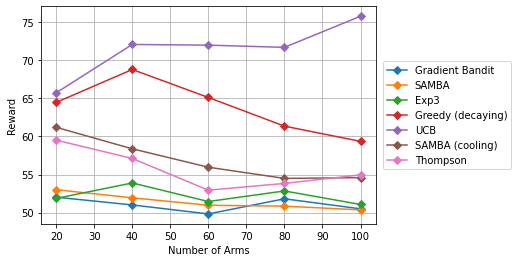

In [60]:
import matplotlib
import matplotlib.pyplot as plt

# Data for plotting
t = np.arange(1, Time+1, 1)

fig, ax = plt.subplots()
ax.plot([20, 40, 60, 80, 100], GBA_results, label='Gradient Bandit', marker="D")
ax.plot([20, 40, 60, 80, 100], samba1_results, label='SAMBA', marker="D")
ax.plot([20, 40, 60, 80, 100], exp3_results, label='Exp3', marker="D")
ax.plot([20, 40, 60, 80, 100], greedy_results, label='Greedy (decaying)', marker="D")
ax.plot([20, 40, 60, 80, 100], ucb_results, label='UCB', marker="D")
ax.plot([20, 40, 60, 80, 100], samba_results, label='SAMBA (cooling)', marker="D")
ax.plot([20, 40, 60, 80, 100], Thomp_results, label='Thompson', marker="D")


ax.set(xlabel='Number of Arms', ylabel='Reward')
ax.grid()
plt.legend(loc='center right',bbox_to_anchor=(1.42, 0.5))

fig.savefig("test.png",dpi=1000,bbox_inches='tight')
fig.savefig('destination_path.eps', format='eps', dpi=1000, bbox_inches='tight')
fig.savefig('destination_path.pdf', format='pdf', dpi=1000, bbox_inches='tight')
plt.show()

In [62]:
tic = time()
samba1_results = []
for num_arms in [20, 40, 60, 80, 100]:
    
    samba1_all_rewards = []
    tic = time()
    for idx, prob in enumerate(probs[num_arms]):
        rewards = []
        bandit = average_samba_bandit(len(prob),alpha=0.1)
        Arms = Bernoulli_multiarm(prob)
        for _ in range(Time):
            arm = bandit.act()
            reward = Arms[arm].pull()
            bandit.train(arm,reward)
            rewards.append(np.sum(Arms.rewards()))    
        samba1_all_rewards.append(rewards)
        print(idx)
        clear_output(wait=True)
    
    print(np.mean([samba1_all_rewards[i][-1] for i in range(len(samba1_all_rewards)) ]))
    samba1_results.append(np.mean([samba1_all_rewards[i][-1] for i in range(len(samba1_all_rewards)) ]))
    
toc = time()    
print(toc-tic)
print(np.mean([samba1_all_rewards[i][-1] for i in range(len(samba1_all_rewards)) ]))

51.49
28.55687403678894
51.49


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


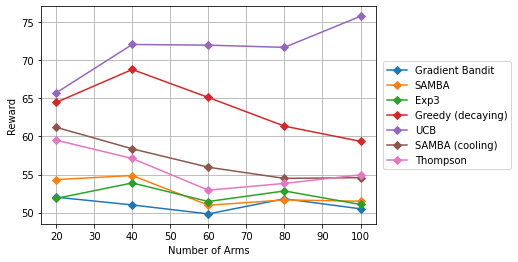

In [63]:
import matplotlib
import matplotlib.pyplot as plt

# Data for plotting
t = np.arange(1, Time+1, 1)

fig, ax = plt.subplots()
ax.plot([20, 40, 60, 80, 100], GBA_results, label='Gradient Bandit', marker="D")
ax.plot([20, 40, 60, 80, 100], samba1_results, label='SAMBA', marker="D")
ax.plot([20, 40, 60, 80, 100], exp3_results, label='Exp3', marker="D")
ax.plot([20, 40, 60, 80, 100], greedy_results, label='Greedy (decaying)', marker="D")
ax.plot([20, 40, 60, 80, 100], ucb_results, label='UCB', marker="D")
ax.plot([20, 40, 60, 80, 100], samba_results, label='SAMBA (cooling)', marker="D")
ax.plot([20, 40, 60, 80, 100], Thomp_results, label='Thompson', marker="D")


ax.set(xlabel='Number of Arms', ylabel='Reward')
ax.grid()
plt.legend(loc='center right',bbox_to_anchor=(1.42, 0.5))

fig.savefig("test.png",dpi=1000,bbox_inches='tight')
fig.savefig('destination_path.eps', format='eps', dpi=1000, bbox_inches='tight')
fig.savefig('destination_path.pdf', format='pdf', dpi=1000, bbox_inches='tight')
plt.show()